## Building a Model to Forecast a Song's Popularity on Spotify

* The dataset was chosen from Kaggel ( Spotify Tracks Dataset | Kaggle, it contains Spotify tracks over a range of 125 different genres initially obtained from the Spotify API.

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from numpy import inf
import scipy
from scipy.stats import yeojohnson
import scipy.stats as stats
from scipy.stats import jarque_bera
from scipy.stats import normaltest
from scipy.stats import shapiro
import sklearn
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.express as px
import plotly.graph_objects as go
import scikitplot as skplt
import statsmodels.api as sm
from statsmodels.tools.eval_measures import mse, rmse
from statsmodels.tsa.stattools import acf
import tensorflow as tf
from yellowbrick.cluster import KElbowVisualizer
import warnings

warnings.filterwarnings('ignore')

df = pd.read_csv(r'/kaggle/input/-spotify-tracks-dataset/dataset.csv')

### Examining the data

In [29]:
df.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [31]:
df.isnull().sum()

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [32]:
duplicates = df[df.duplicated()]

# Display the duplicate rows
print("Duplicate Rows except first occurrence based on all columns:")
print(duplicates)

Duplicate Rows except first occurrence based on all columns:
Empty DataFrame
Columns: [Unnamed: 0, track_id, artists, album_name, track_name, popularity, duration_ms, explicit, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, time_signature, track_genre]
Index: []

[0 rows x 21 columns]


In [33]:
df.shape

(114000, 21)

In [34]:
df.describe()

,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,56999.500000,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,32909.109681,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28499.750000,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,56999.500000,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,85499.250000,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,113999.000000,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


### Data Cleaning

In [35]:
# The following categories are not relevant, this study is in regards to what features make a song "popular" on Spotify not which artist or the name of the song nor album

df = df.drop(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name'], axis=1)

In [36]:
df.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [37]:
df.shape

(114000, 16)

In [38]:
# Removing non-music tracks.

df = df[df['speechiness'] <= 0.7]

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113139 entries, 0 to 113999
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   popularity        113139 non-null  int64  
 1   duration_ms       113139 non-null  int64  
 2   explicit          113139 non-null  bool   
 3   danceability      113139 non-null  float64
 4   energy            113139 non-null  float64
 5   key               113139 non-null  int64  
 6   loudness          113139 non-null  float64
 7   mode              113139 non-null  int64  
 8   speechiness       113139 non-null  float64
 9   acousticness      113139 non-null  float64
 10  instrumentalness  113139 non-null  float64
 11  liveness          113139 non-null  float64
 12  valence           113139 non-null  float64
 13  tempo             113139 non-null  float64
 14  time_signature    113139 non-null  int64  
 15  track_genre       113139 non-null  object 
dtypes: bool(1), float64(9), i

In [40]:
# Identify numeric and categorical columns

numeric_cols = []
categorical_cols = []
for col in df.columns:
    if df[col].dtype == np.float64 or df[col].dtype == np.int64:
        numeric_cols.append(col)
    else:
        categorical_cols.append(col)

print('numeric columns:', numeric_cols)
print('Categorical columns:', categorical_cols)

numeric columns: ['popularity', 'duration_ms', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']
Categorical columns: ['explicit', 'track_genre']


In [41]:
# Seperate out the discrete numeric columns

discrete_numeric=[feature for feature in numeric_cols if df[feature].nunique()<20]
discrete_numeric

['key', 'mode', 'time_signature']

* Mode, time_signature, and key will be treated as a categorical features, label encoding will be performed.

In [42]:
df['mode'] = df['mode'].replace({0: 'minor', 1: 'major'})

In [43]:
df['key'] = df['key'].replace({0: 'C', 1: 'C-sharp_D-flat', 2: 'D', 3: 'D-sharp_E-flat', 4: 'E', 5: 'F', 6: 'F-sharp_G-flat', 7: 'G', 8: 'G-sharp_A-flat', 9: 'A', 10: 'A-sharp_B-flat', 11: 'B'})

In [44]:
# Checking time_signature for values outside the stated range of 3 - 7.

num_below_3 = len(df[df['time_signature'] < 3])
pct_below_3 = (num_below_3 / len(df)) * 100
print(f"{pct_below_3:.2f}% of values are less than 3")

# Calculate the percentage of values greater than 7
num_above_7 = len(df[df['time_signature'] > 7])
pct_above_7 = (num_above_7 / len(df)) * 100
print(f"{pct_above_7:.2f}% of values are greater than 7")

0.95% of values are less than 3
0.00% of values are greater than 7


In [45]:
# Dropping time_signature values less than three. These values must be in error.

df = df.loc[df['time_signature'] >= 3]

In [46]:
df['time_signature'] = df['time_signature'].replace({3: '3/4', 4: '4/4', 5: '5/4', 6: '6/4', 7: '7/4'})

In [47]:
# Dropping all rows where "duration_ms" is equal to 0.

df = df[df['duration_ms']!=0]

In [48]:
df.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,73,230666,False,0.676,0.4610,C-sharp_D-flat,-6.746,minor,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4/4,acoustic
1,55,149610,False,0.420,0.1660,C-sharp_D-flat,-17.235,major,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4/4,acoustic
2,57,210826,False,0.438,0.3590,C,-9.734,major,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4/4,acoustic
3,71,201933,False,0.266,0.0596,C,-18.515,major,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3/4,acoustic
4,82,198853,False,0.618,0.4430,D,-9.681,major,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4/4,acoustic


In [49]:
numeric_cols = []
categorical_cols = []
for col in df.columns:
    if df[col].dtype == np.float64 or df[col].dtype == np.int64:
        numeric_cols.append(col)
    else:
        categorical_cols.append(col)

print('numeric columns:', numeric_cols)
print('Categorical columns:', categorical_cols)

numeric columns: ['popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
Categorical columns: ['explicit', 'key', 'mode', 'time_signature', 'track_genre']


#### Checking for Outliers

In [50]:
# Check for outliers
max_rows = 50
# Calculate the Z-Score for each value in the numeric columns
z_scores = (df[numeric_cols] - df[numeric_cols].mean()) / df[numeric_cols].std()

# Find the absolute value of the Z-Scores greater than threshold 3
threshold = 3
outliers = (z_scores.abs() > threshold).any(axis=1)

# Get the style of the outliers and limit the number of rows to display
outliers_style = df[outliers].style.background_gradient(cmap='Reds').set_table_attributes("style='display: table-row-group;'").set_caption(f"Outliers ({outliers.sum()} rows)")
outliers_html = outliers_style._repr_html_()

# Get the table header and limit the number of rows to display
header = df.head(0).style.set_table_attributes("style='display: none;'")._repr_html_()
data = df.head(max_rows if len(df) > max_rows else len(df)).style._repr_html_()

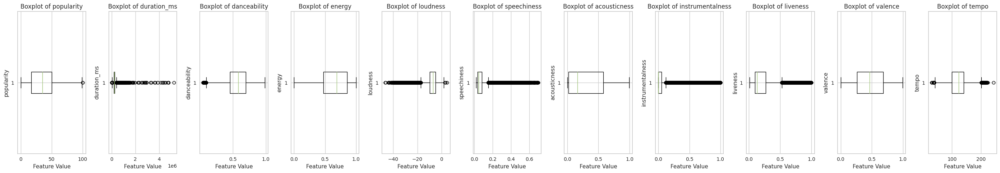

In [51]:
fig, axes = plt.subplots(nrows=1, ncols=len(numeric_cols), figsize=(28, 5))

# Create a box plot for each column in the numeric data
for i, col in enumerate(numeric_cols):
    axes[i].boxplot(df[col], vert=False)

    axes[i].set_title(f"Boxplot of {col}")
    axes[i].set_xlabel("Feature Value")
    axes[i].set_ylabel(col)

fig.tight_layout()

plt.show()

In [52]:
# Calculate percentage of outliers for each numeric feature via IQR method
for col in numeric_cols:
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    upper_boundary = q3 + 1.5 * iqr
    lower_boundary = q1 - 1.5 * iqr
    outliers = df[(df[col] < lower_boundary) | (df[col] > upper_boundary)][col]
    outlier_percent = outliers.count() / df[col].count() * 100
    print(f"{col} has {outlier_percent}% outliers")

popularity has 0.0017847740922192774% outliers
duration_ms has 4.947393783631837% outliers
danceability has 0.41049804121043376% outliers
energy has 0.0% outliers
loudness has 5.2927475704762665% outliers
speechiness has 11.277987488733613% outliers
acousticness has 0.0% outliers
instrumentalness has 22.11156622850463% outliers
liveness has 7.119463853862697% outliers
valence has 0.0% outliers
tempo has 0.42656100804040725% outliers


* The outliers for "speechiness", "instrumentalness", and "time_signature" will not be removed. This data is too important and can be easily misleading if treated. For example treating "speechiness" and "instrumentalness" may remove rap songs on one end and classical on the other, both of which would have components of making a song popular. 
<br>

* The features "duration_ms", "liveness", and "loudness" will be transformed by the Yeo-Johnson method.

In [53]:
transformed_data = df.copy()

transformed_data['duration_ms'], duration_lambda = yeojohnson(transformed_data['duration_ms'])
transformed_data['loudness'], loudness_lambda = yeojohnson(transformed_data['loudness'])
transformed_data['liveness'], loudness_lambda = yeojohnson(transformed_data['liveness'])

print(transformed_data[['duration_ms', 'loudness', 'liveness']].describe())

         duration_ms       loudness       liveness
count  112059.000000  112059.000000  112059.000000
mean       25.341962      -2.261355       0.096334
std         1.383876       0.558549       0.033661
min        16.915315      -4.407294       0.008957
25%        24.597291      -2.591929       0.071265
50%        25.324010      -2.225323       0.086911
75%        26.088354      -1.899740       0.126444
max        39.445209      13.602589       0.163377


In [54]:
num_cols = ['popularity', 'duration_ms', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
df_num = transformed_data[num_cols]

for col in num_cols:
    q1 = transformed_data[col].quantile(0.25)
    q3 = transformed_data[col].quantile(0.75)
    iqr = q3 - q1
    upper_boundary = q3 + 1.5 * iqr
    lower_boundary = q1 - 1.5 * iqr
    outliers = transformed_data[(transformed_data[col] < lower_boundary) | (transformed_data[col] > upper_boundary)][col]
    outlier_percent = outliers.count() / transformed_data[col].count() * 100
    print(f"{col} has {outlier_percent}% outliers")

popularity has 0.0017847740922192774% outliers
duration_ms has 4.457473295317645% outliers
danceability has 0.41049804121043376% outliers
energy has 0.0% outliers
loudness has 2.259524000749605% outliers
speechiness has 11.277987488733613% outliers
acousticness has 0.0% outliers
instrumentalness has 22.11156622850463% outliers
liveness has 0.0% outliers
valence has 0.0% outliers
tempo has 0.42656100804040725% outliers


* The Yeo-Johnson was able to reduce the percentage of outliers in "loudness" by over 50%.
<br>

* The percentage of outliers for "liveness" was reduced to 0.0%.
<br>
* The "duration_ms" feature's percentage of outliers was not significantly reduced.
<br>
* Being that the goal of outlier detection is to identify values that are significantly outside the general distribution of the data, the wise choice seems to be to leave the data as is within a 1.5 IQR multiplier. Some songs are just LONG.

#### Checking Numerical Features Distribution

In [55]:
df_t = transformed_data.copy()

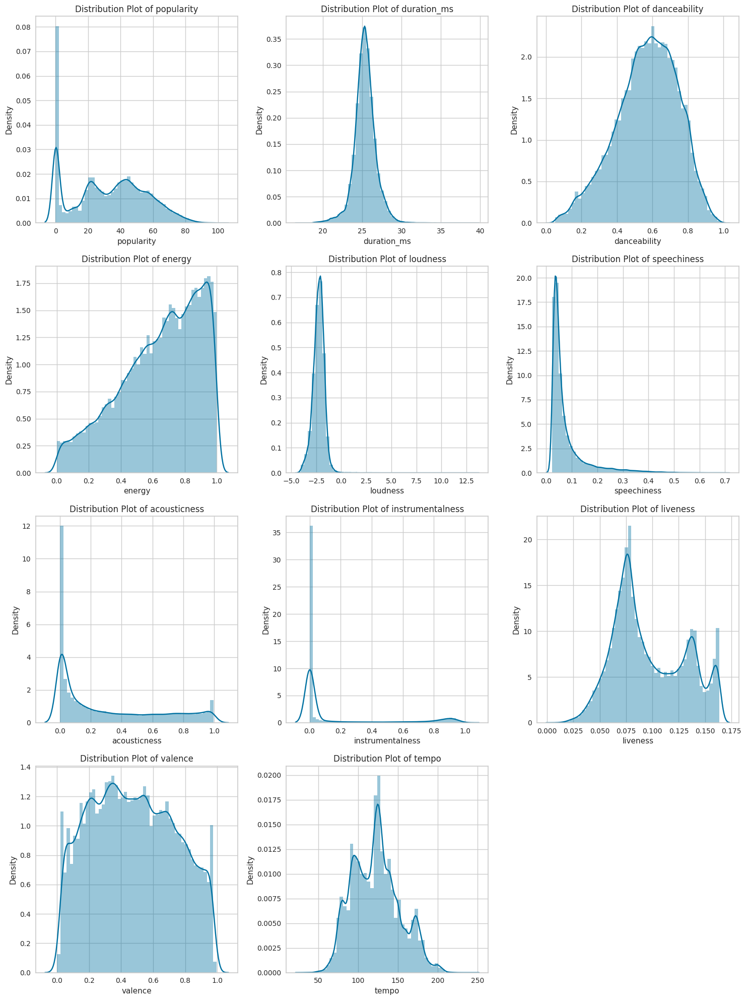

In [56]:
n_cols = len(num_cols)
n_rows = int(np.ceil(n_cols / 3))

fig, axes = plt.subplots(n_rows, 3, figsize=(15, 5*n_rows))

for i, col in enumerate(num_cols):
    row_idx = i // 3
    col_idx = i % 3
    sns.distplot(df_t[col], ax=axes[row_idx, col_idx], kde=True)

    axes[row_idx, col_idx].set_title(f"Distribution Plot of {col}")
    axes[row_idx, col_idx].set_xlabel(col)

for i in range(n_cols, n_rows*3):
    fig.delaxes(axes.flatten()[i])

fig.tight_layout()

plt.show()

In [57]:
data = df_t[['popularity', 'duration_ms', 'danceability', 'energy', 
            'loudness', 'speechiness', 'acousticness', 'instrumentalness', 
            'liveness', 'valence', 'tempo']]

# iterate through each column and perform K-S test
for col in data.columns:
    kstest_result = stats.kstest(data[col], 'norm')

    # Print the test statistic and p-value for each column
    print(f"{col} - K-S test statistic:", kstest_result.statistic)
    print(f"{col} - p-value:", kstest_result.pvalue)

popularity - K-S test statistic: 0.828855618705089
popularity - p-value: 0.0
duration_ms - K-S test statistic: 1.0
duration_ms - p-value: 0.0
danceability - K-S test statistic: 0.5528916332150597
danceability - p-value: 0.0
energy - K-S test statistic: 0.5140486008696548
energy - p-value: 0.0
loudness - K-S test statistic: 0.8779773931462949
loudness - p-value: 0.0
speechiness - K-S test statistic: 0.5089963861157459
speechiness - p-value: 0.0
acousticness - K-S test statistic: 0.5
acousticness - p-value: 0.0
instrumentalness - K-S test statistic: 0.5
instrumentalness - p-value: 0.0
liveness - K-S test statistic: 0.5075458634183203
liveness - p-value: 0.0
valence - K-S test statistic: 0.5077828628532745
valence - p-value: 0.0
tempo - K-S test statistic: 1.0
tempo - p-value: 0.0


* Visually and statistically (p-value < 0.05) none of the numeric columns are normally distributed

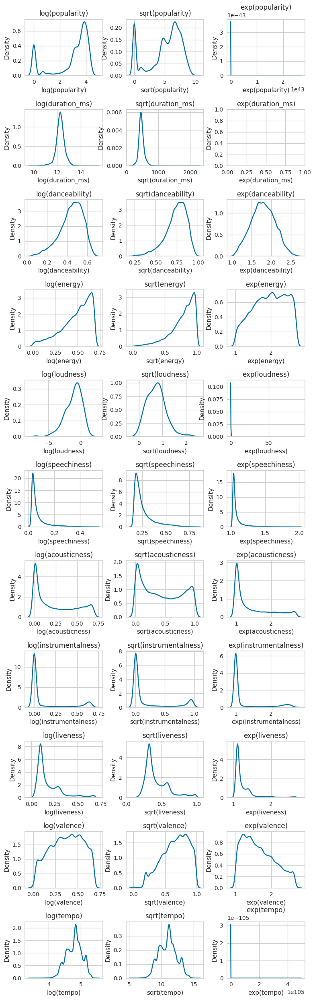

In [58]:
# Checking if any transformations will achieve a more normal distribution.

num_cols = ['popularity', 'duration_ms', 'danceability', 'energy', 
            'loudness', 'speechiness', 'acousticness', 'instrumentalness', 
            'liveness', 'valence', 'tempo']

new_df = pd.DataFrame()
for col_name in num_cols:
    new_df[f'log({col_name})'] = np.log1p(df[col_name])
    new_df[f'sqrt({col_name})'] = np.sqrt(df[col_name])
    new_df[f'exp({col_name})'] = np.exp(df[col_name])

plot_cols = 3

fig_width = 8
fig_height = 25
subplot_width = fig_width / plot_cols
subplot_height = fig_height / (len(num_cols) / plot_cols)

fig, axes = plt.subplots(len(num_cols), plot_cols, figsize=(fig_width, fig_height))

# Loop through each column/transformation combination and plot using subplots with Seaborn
for i, col_name in enumerate(num_cols):
    for j, transform in enumerate(['log', 'sqrt', 'exp']):
        plot_data = new_df[f"{transform}({col_name})"]
        plot_title = f"{transform}({col_name})"
        ax = axes[i, j]
        sns.kdeplot(plot_data, ax=ax)
        ax.set_title(plot_title)

# Adjust spacing and labels
plt.tight_layout()
plt.subplots_adjust(hspace=0.6, wspace=0.3)
plt.show()

* None of the transformations visually appear to make any large improment on any of the features.  Log, square, or expodential transformations will not be performed.

#### Data Exploration and Feature Engineering

In [59]:
df_t.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,73,25.617098,False,0.676,0.4610,C-sharp_D-flat,-2.193900,minor,0.1430,0.0322,0.000001,0.139684,0.715,87.917,4/4,acoustic
1,55,24.038145,False,0.420,0.1660,C-sharp_D-flat,-3.204300,major,0.0763,0.9240,0.000006,0.073014,0.267,77.489,4/4,acoustic
2,57,25.283064,False,0.438,0.3590,C,-2.572105,major,0.0557,0.2100,0.000000,0.080751,0.120,76.332,4/4,acoustic
3,71,25.124131,False,0.266,0.0596,C,-3.286862,major,0.0363,0.9050,0.000071,0.087330,0.143,181.740,3/4,acoustic
4,82,25.067625,False,0.618,0.4430,D,-2.566305,major,0.0526,0.4690,0.000000,0.063252,0.167,119.949,4/4,acoustic


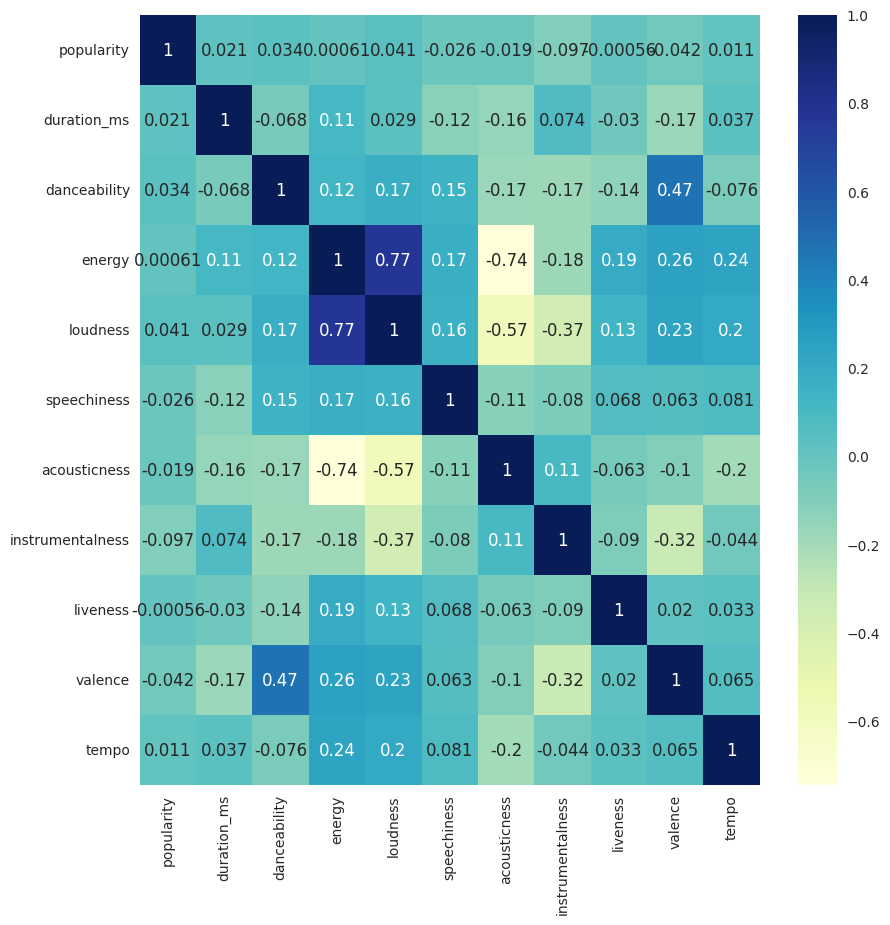

In [60]:
num_cols = df_t.select_dtypes(include=['int64', 'float64'])
corr_data = num_cols.corr()

fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corr_data, cmap="YlGnBu", annot=True)

plt.show()

* None of the continuous features are correlated with the target (popularity)
<br>
* Loudness and energy show multicolinearity (0.77). Because "energy" is a subjective rating versus "loudness" which is measured, energy  will be dropped from the data set.

In [61]:
df_t = df_t.drop(['energy'], axis=1)

#### Checking the Balance of Categorical Features

In [62]:
continuous_cols = []
categorical_cols = []
for col in df_t.columns:
    if df_t[col].dtype == np.float64 or df_t[col].dtype == np.int64:
        continuous_cols.append(col)
    else:
        categorical_cols.append(col)

print('Continuous columns:', continuous_cols)
print('Categorical columns:', categorical_cols)

Continuous columns: ['popularity', 'duration_ms', 'danceability', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']
Categorical columns: ['explicit', 'key', 'mode', 'time_signature', 'track_genre']


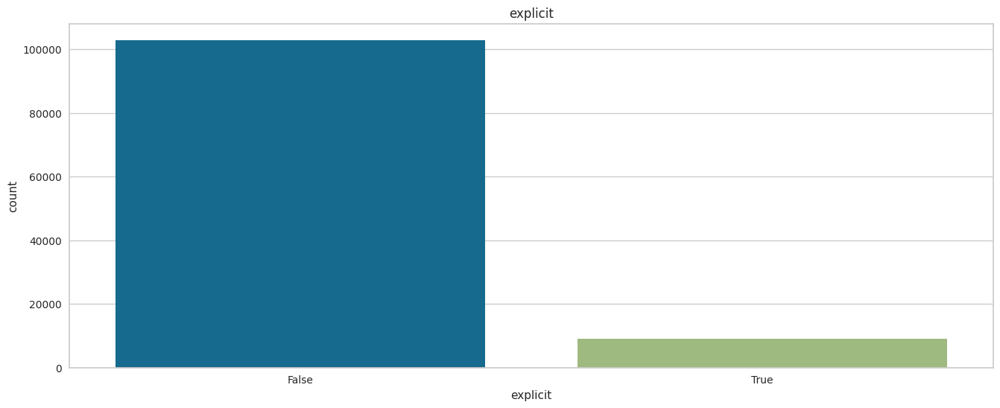

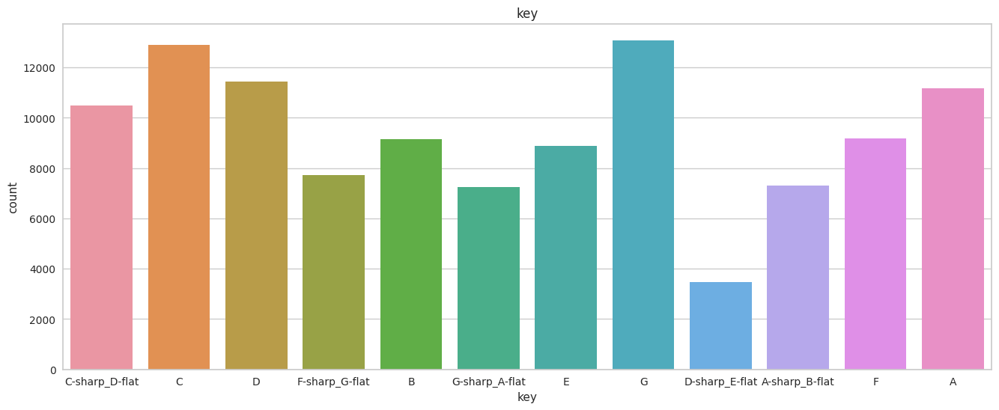

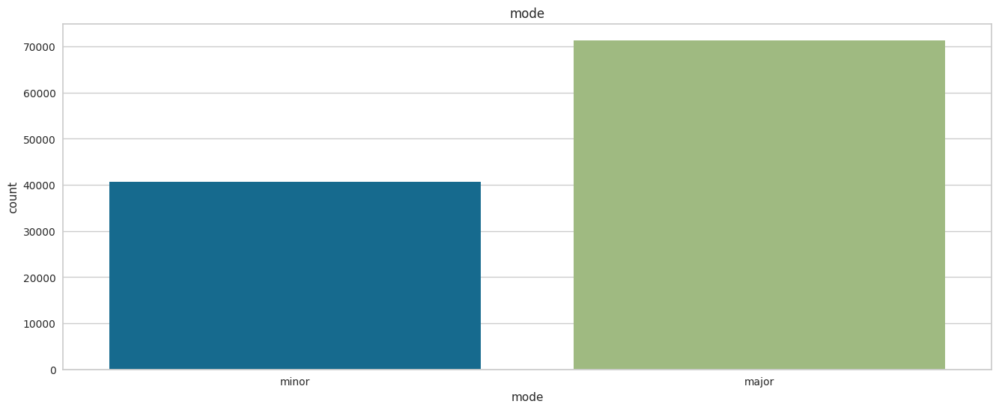

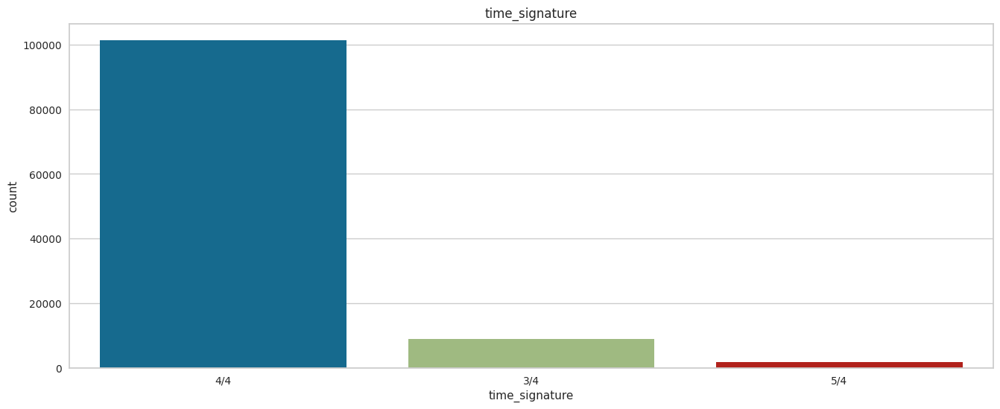

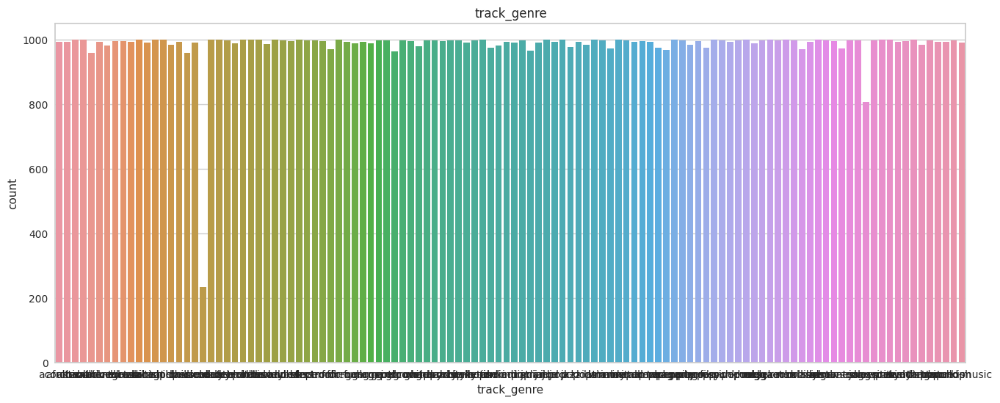

In [63]:
for column in categorical_cols:
    plt.figure(figsize=(16, 6))
    sns.countplot(x=column, data=df_t.loc[:,categorical_cols])
    plt.title(column)

* All categorical features are unbalanced.

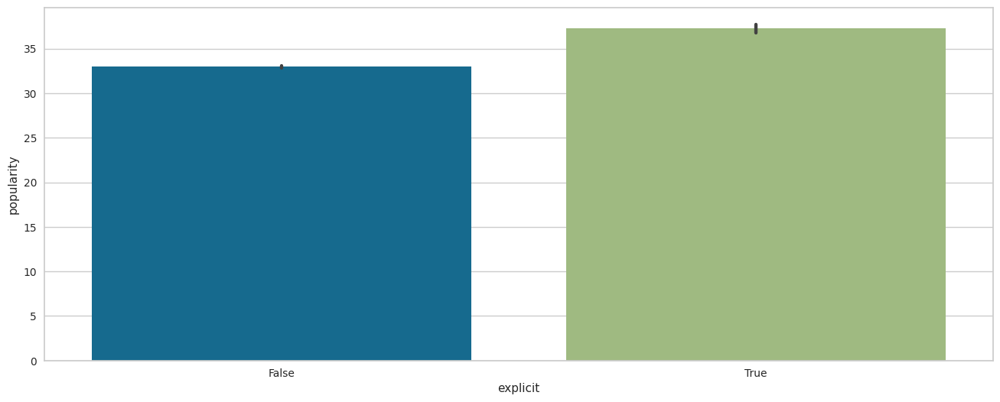

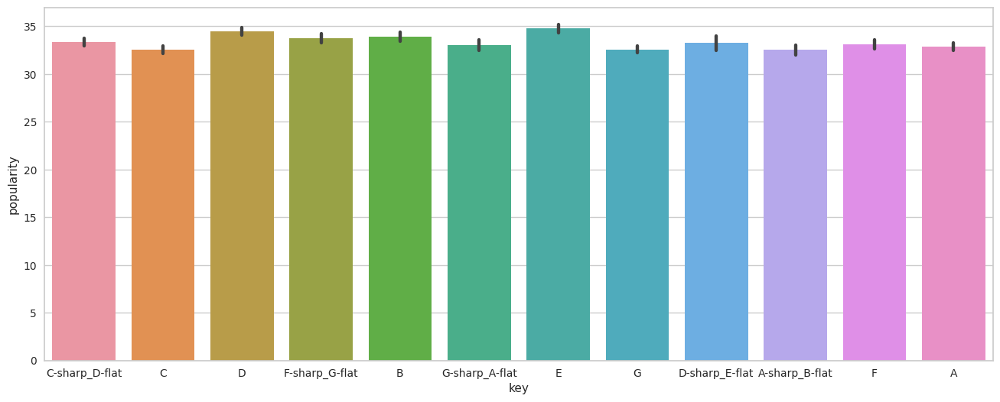

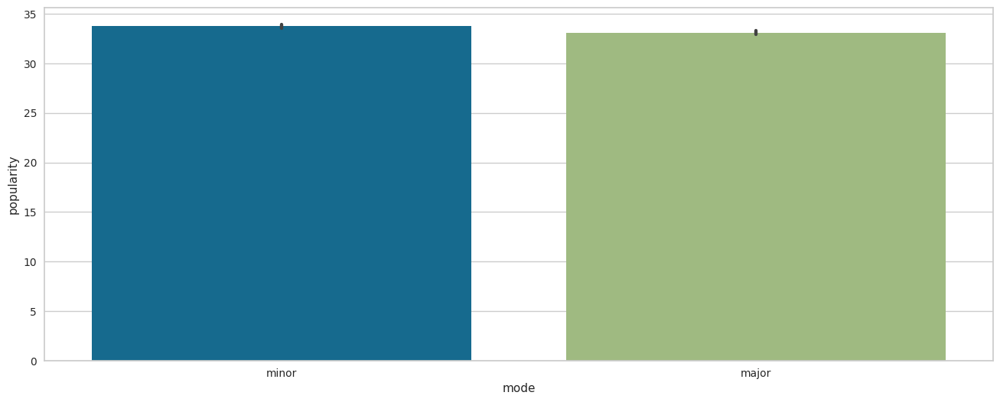

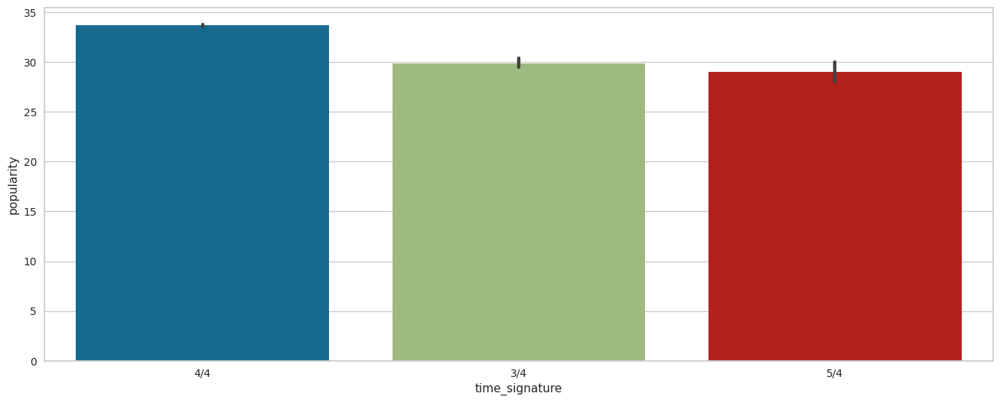

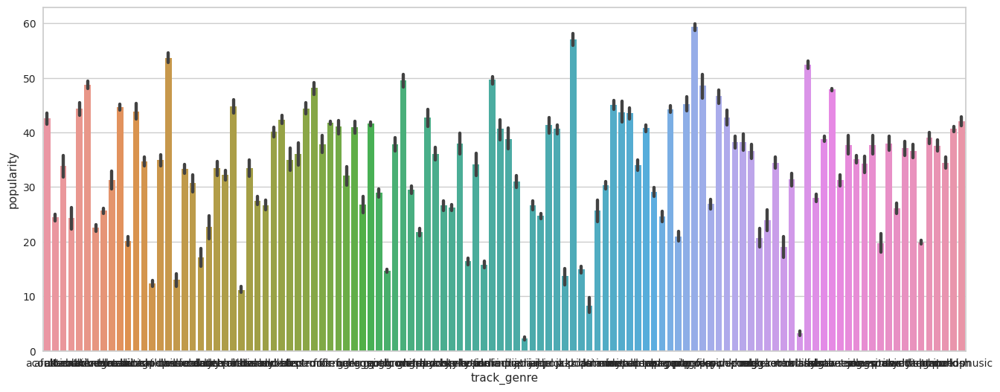

In [64]:
for column in categorical_cols:
    dataset=df_t.copy()
    plt.figure(figsize=(16, 6))
    sns.barplot(x=column, y=dataset['popularity'], data=dataset, estimator=np.mean)
    plt.show()

* Explicit songs have a higher popularity score. It's interesting to note that although the data contains far more non-explicit songs containing explicit content have a higher mean popularity score.
<br>

* Key popularity scores are similar, however E does have the lead.
<br>
* Minor appears to barely have the edge in popularity score. A similar effect as seen in the explicit category happens here. Far more songs are in major but minor gets the edge in popularity.
<br>
* The time signature of 4/4 has the highest popularity score and the vast majority of songs were in 4/4.
<br>
* They're too many genres to make out on the plot who the winner is.

In [65]:
top_five_genres = df_t.groupby("track_genre")["popularity"].mean().nlargest(5)

# Create a new DataFrame with the top five genres and their mean popularity
table = pd.DataFrame({'track_genre': top_five_genres.index, 'mean_popularity': top_five_genres.values}).set_index('track_genre')

print(table)

             mean_popularity
track_genre                 
pop-film           59.350754
k-pop              57.026210
chill              53.699294
sad                52.422379
indian             49.622449


* Pop-film edges out k-pop in mean popularity score.
* Now that the top genres have been calculated it's time to drop the column. Most artists have a passion for the genre they play. Music is an art of passion and most artists would not change genres to get a hit song therefore continuing foward we'll focus more on the technical aspects of a song.

In [66]:
df_t = df_t.drop(['track_genre'], axis=1)

In [67]:
df_t.info()

<class 'pandas.core.frame.DataFrame'>
Index: 112059 entries, 0 to 113999
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   popularity        112059 non-null  int64  
 1   duration_ms       112059 non-null  float64
 2   explicit          112059 non-null  bool   
 3   danceability      112059 non-null  float64
 4   key               112059 non-null  object 
 5   loudness          112059 non-null  float64
 6   mode              112059 non-null  object 
 7   speechiness       112059 non-null  float64
 8   acousticness      112059 non-null  float64
 9   instrumentalness  112059 non-null  float64
 10  liveness          112059 non-null  float64
 11  valence           112059 non-null  float64
 12  tempo             112059 non-null  float64
 13  time_signature    112059 non-null  object 
dtypes: bool(1), float64(9), int64(1), object(3)
memory usage: 12.1+ MB


In [68]:
num_rows = df_t.shape[0]
num_col = df_t.shape[1]
total_samples = num_rows * num_col

print('Number of rows:', num_rows)
print('Number of columns:', num_col)
print('Total number of samples:', total_samples)

Number of rows: 112059
Number of columns: 14
Total number of samples: 1568826


### Modeling

* First up determining K for KMeans clustering.
<br>
* Followed by running a KMeans clustering model using TensorFlow and Pycaret to determine any patterns and/or relationships in the data.

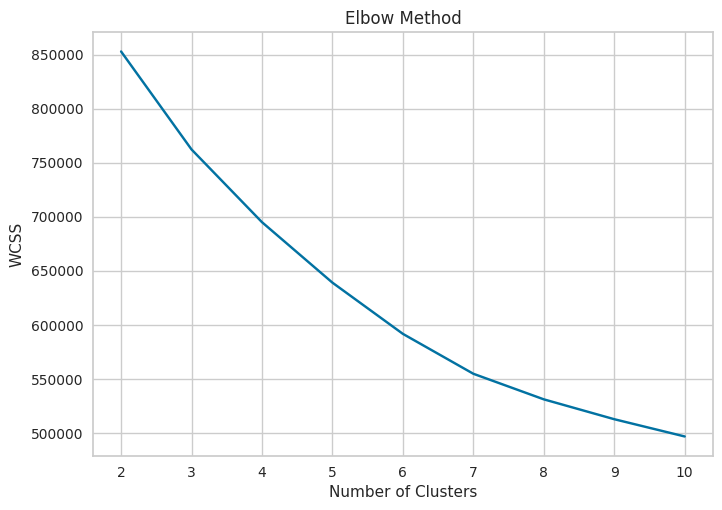

In [69]:
num_cols = ["duration_ms", "tempo", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "danceability"]
df_scaled = df_t[num_cols].copy()

# Scale the selected columns
scaler = StandardScaler()
df_scaled[num_cols] = scaler.fit_transform(df_scaled)

# Calculate WCSS for different values of k
wcss = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)
    
plt.plot(range(2, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

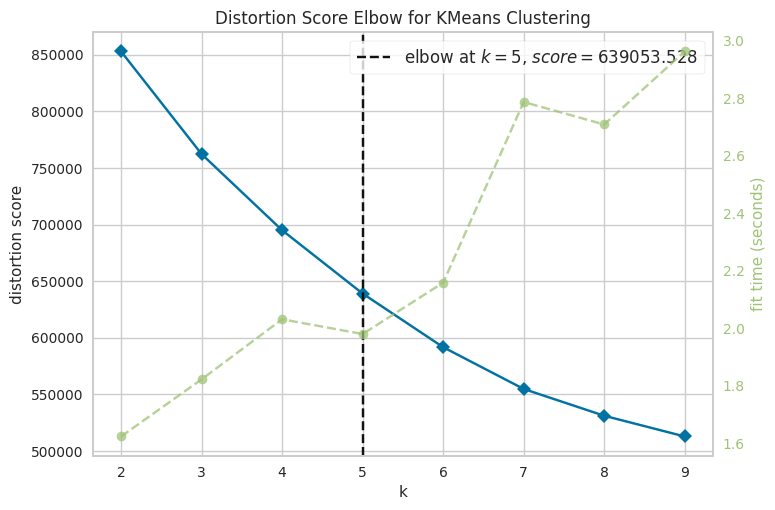

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [70]:
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,10))
visualizer.fit(df_scaled)
visualizer.show()

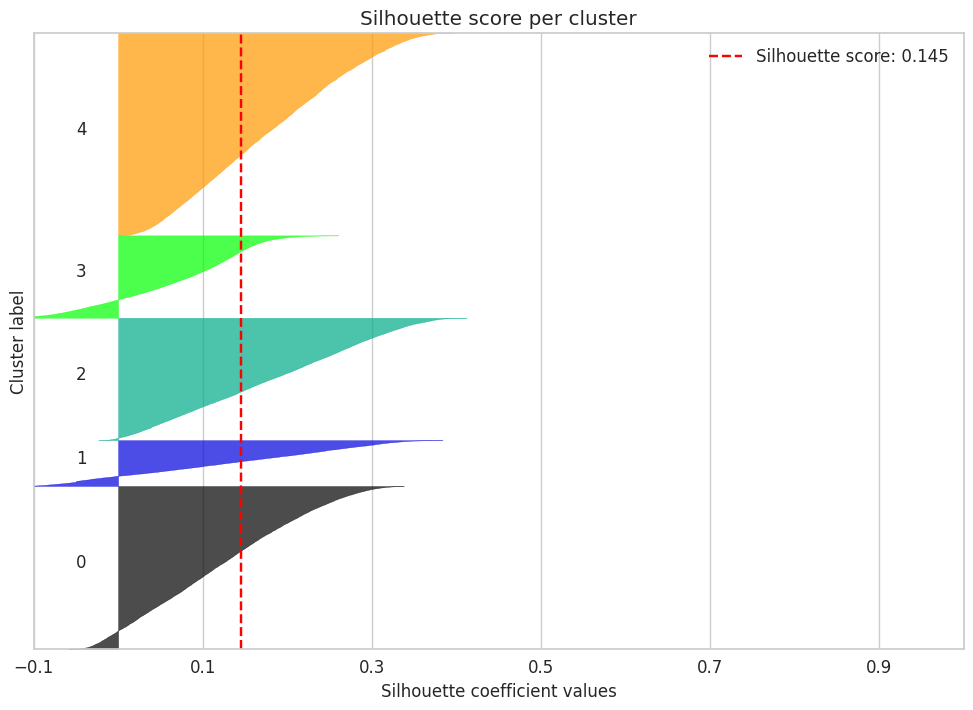

In [71]:
kmeans = KMeans(n_clusters = 5)
kmeans.fit(df_scaled)

skplt.metrics.plot_silhouette(df_scaled,
                            kmeans.labels_,
                            title='Silhouette score per cluster',
                            figsize=(12,8))
plt.show()

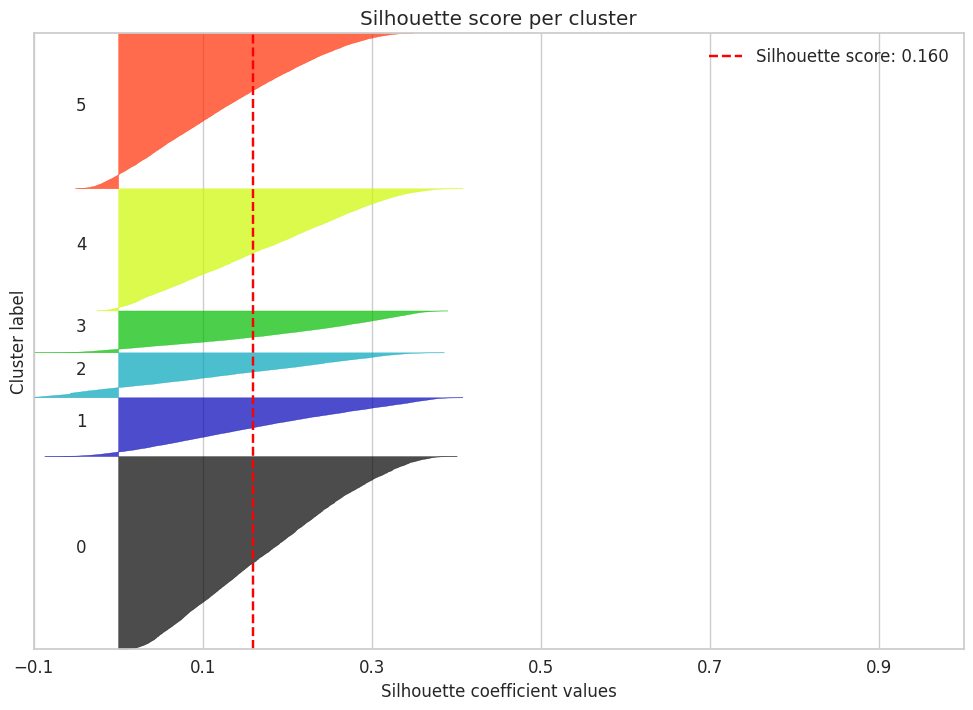

In [72]:
kmeans = KMeans(n_clusters = 6)
kmeans.fit(df_scaled)

skplt.metrics.plot_silhouette(df_scaled,
                            kmeans.labels_,
                            title='Silhouette score per cluster',
                            figsize=(12,8))
plt.show()

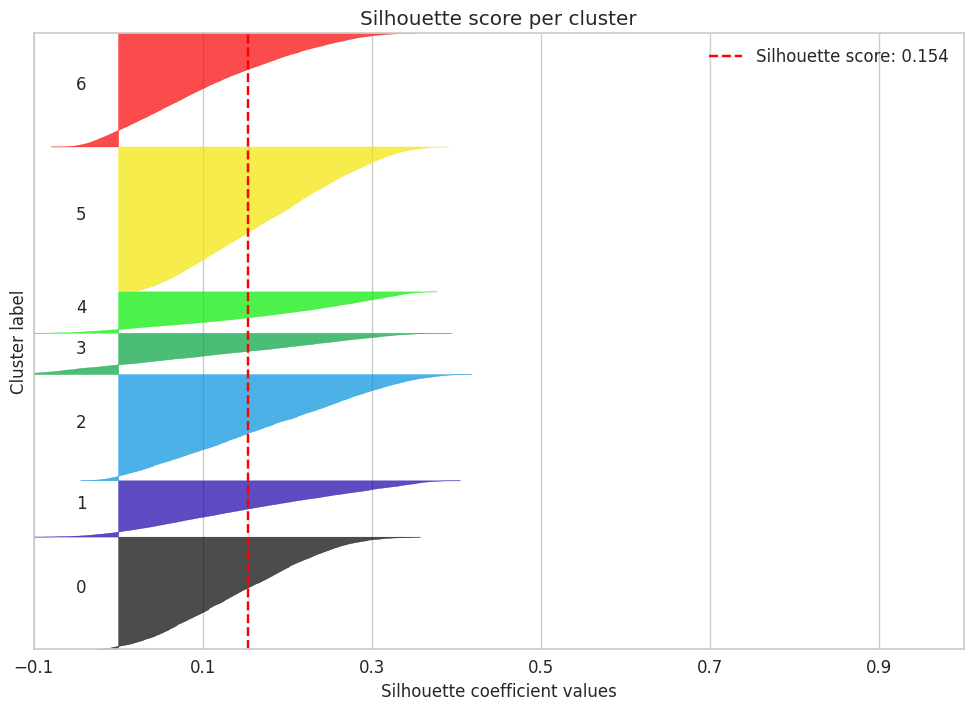

In [73]:
kmeans = KMeans(n_clusters = 7)
kmeans.fit(df_scaled)

skplt.metrics.plot_silhouette(df_scaled,
                            kmeans.labels_,
                            title='Silhouette score per cluster',
                            figsize=(12,8))
plt.show()

* All of the Silhoutte scores and the elbow graph indicate that the data points may be overlapping or are poorly seperated into distinct clusters.
* Kmeans will be tried with n_clusters=6

In [74]:
# Use KMeans algorithm to cluster the data using TensorFlow KMeans
kmeans = tf.compat.v1.estimator.experimental.KMeans(
    num_clusters=6,
    use_mini_batch=False,
)

def input_fn():
    return tf.compat.v1.train.limit_epochs(
        tf.convert_to_tensor(df_scaled.values, dtype=tf.float32), num_epochs=1)

# Cluster the data using KMeans
kmeans.train(input_fn)

cluster_ids = list(kmeans.predict_cluster_index(input_fn))

df_scaled['cluster_id'] = cluster_ids

# Calculate the cluster centers
with tf.compat.v1.Session() as sess:
    sess.run(tf.compat.v1.global_variables_initializer())
    sess.run(tf.compat.v1.tables_initializer())
    centroids = kmeans.cluster_centers()

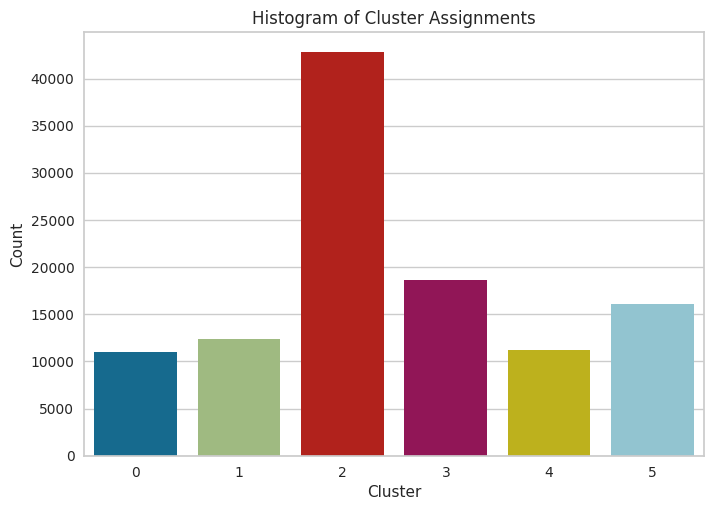

In [75]:
sns.countplot(data=df_scaled, x='cluster_id')
plt.title('Histogram of Cluster Assignments')
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.show()

In [76]:
trace = go.Scatter3d(
    x=df_t['duration_ms'],
    y=df_t['loudness'],
    z=df_t['tempo'],
    mode='markers',
    marker=dict(
        size=12,
        color=df_scaled['cluster_id'],               
        colorscale='Viridis',                
        opacity=0.8)
)
layout = go.Layout(scene=dict(
        xaxis_title='Duration_ms',
        yaxis_title='Loudness',
        zaxis_title='Tempo'),
        title='3D Scatter Plot of Clusters',
        width=800,
        height=600, 
)

fig = go.Figure(data=[trace], layout=layout)

fig.show()

In [80]:
import pycaret
from pycaret.clustering import *

clustering_setup = setup(df_scaled, preprocess=False, use_gpu=True)

kmeans_model = create_model('kmeans', num_clusters=6)
kmeans_results = assign_model(kmeans_model)
plot_model(kmeans_model, 'cluster')

print(kmeans_results)

,Description,Value
0,Session id,8362
1,Original data shape,"(112059, 10)"
2,Transformed data shape,"(112059, 10)"
3,Numeric features,10


,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1628,19061.7012,1.6980,0,0,0


Processing:   0%|          | 0/3 [00:00<?, ?it/s]

        duration_ms     tempo  loudness  speechiness  acousticness  \
0          0.198817 -1.173227  0.120769     0.829391     -0.839959   
1         -0.942153 -1.525965 -1.688213    -0.028371      1.866672   
2         -0.042560 -1.565102 -0.556355    -0.293287     -0.300332   
3         -0.157407  2.000435 -1.836029    -0.542771      1.809007   
4         -0.198239 -0.089711 -0.545971    -0.333153      0.485738   
...             ...       ...       ...          ...           ...   
113995     1.618695  0.114801 -1.585602    -0.466897      1.004726   
113996     1.618703 -1.263813 -1.813879    -0.493903      2.079123   
113997     0.641857  0.330713 -0.772592    -0.469469      1.693676   
113998     0.764972  0.451878 -0.771526    -0.627647      0.218656   
113999     0.326552 -1.468156 -0.646404    -0.077239      1.129162   

        instrumentalness  liveness   valence  danceability  cluster_id  \
0              -0.502921  1.287828  0.921856      0.622173           3   
1          

* Both the TensorFlow and Pycaret models show that the data is densely packed and overlapping.
* PCA will be use next to determine most relevent features from the numeric features.

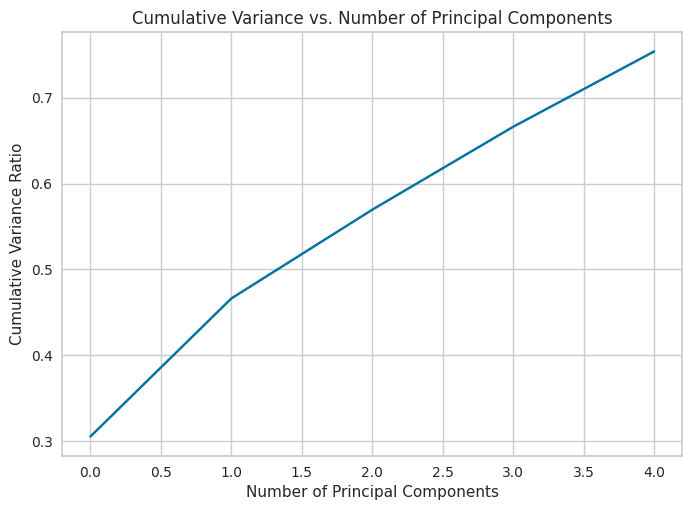

PC1 explains 30.52% of the variance in the data
PC2 explains 16.09% of the variance in the data
PC3 explains 10.35% of the variance in the data
PC4 explains 9.67% of the variance in the data
PC5 explains 8.78% of the variance in the data


In [81]:
pca = PCA(n_components=5)
pca.fit(df_scaled)
df_pca = pca.transform(df_scaled)

variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(variance_ratio)
plt.plot(cumulative_variance_ratio)
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Ratio')
plt.title('Cumulative Variance vs. Number of Principal Components')
plt.show()

for i in range(len(variance_ratio)):
    print(f"PC{i+1} explains {variance_ratio[i]*100:.2f}% of the variance in the data")

In [82]:
important_features = [x for _, x in sorted(zip(variance_ratio, num_cols), reverse=True)]

# Print the names of the most important features
print('The most important features are:', important_features)

The most important features are: ['duration_ms', 'tempo', 'loudness', 'speechiness', 'acousticness']


* Using the categorical features and the top three continuous features from the data, we'll use Pycaret to evaluate several models

In [83]:
print(df_t.dtypes)

popularity            int64
duration_ms         float64
explicit               bool
danceability        float64
key                  object
loudness            float64
mode                 object
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature       object
dtype: object


In [85]:
from pycaret.regression import *

# Load the dataset
data = df_t

reg = setup(data, target='popularity', session_id=123,
            categorical_features=['key', 'mode', 'time_signature'],
            normalize=True, normalize_method='zscore',
            ignore_features=['danceability', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'explicit'])

# Compare various regression models and evaluate performance
best_model = compare_models(fold=5)


,Description,Value
0,Session id,123
1,Target,popularity
2,Target type,Regression
3,Original data shape,"(112059, 14)"
4,Transformed data shape,"(112059, 20)"
5,Transformed train set shape,"(78441, 20)"
6,Transformed test set shape,"(33618, 20)"
7,Ignore features,7
8,Ordinal features,1
9,Numeric features,3


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,13.0007,303.5984,17.4239,0.3968,1.0608,0.8386,18.8560
et,Extra Trees Regressor,11.9642,311.6091,17.6523,0.3809,0.9657,0.7581,7.1660
xgboost,Extreme Gradient Boosting,17.2950,432.8782,20.8055,0.1400,1.4108,1.2954,4.6680
catboost,CatBoost Regressor,17.5633,443.9049,21.0689,0.1181,1.4308,1.3297,6.3900
knn,K Neighbors Regressor,16.7826,459.5787,21.4377,0.0870,1.2608,1.0692,3.1000
lightgbm,Light Gradient Boosting Machine,17.9977,460.7039,21.4639,0.0848,1.4597,1.3830,1.1640
gbr,Gradient Boosting Regressor,18.5170,484.9387,22.0212,0.0366,1.4888,1.4474,4.7820
ada,AdaBoost Regressor,18.7949,496.8372,22.2897,0.0130,1.5063,1.5010,1.1540
lr,Linear Regression,18.9403,501.1543,22.3864,0.0044,1.5008,1.4818,1.1480
br,Bayesian Ridge,18.9430,501.1640,22.3866,0.0044,1.5009,1.4815,0.2560


Processing:   0%|          | 0/85 [00:00<?, ?it/s]

### The data appears to be true to life and manufacturing or predicting a song's popularity is not something that can be done on a reliable basis.

* The best model produced was a Random Forest Regressor with an R^2 of 0.40